#**Guided Diffusion** 

The key idea behind diffusion models is the use of a parameterized Markov chain, which is trained to produce samples from a data distribution by reversing a gradual, multi-step noising process starting from a pure noise $x_{T}$,and denoising at every step to produce less noisy samples $x_{T-1}, x_{T-2}, \dots$ reaching the final synthesized sample $x_{0}$.

# Load model

In [ ]:
!git clone https://github.com/sreevishnu-damodaran/clip-diffusion-art.git -q

In [ ]:
%cd /content/clip-diffusion-art
!pip install -e . -q

/content/clip-diffusion-art
     |████████████████████████████████| 1.8 MB 7.4 MB/s 
     |████████████████████████████████| 493 kB 41.8 MB/s 
     |████████████████████████████████| 1.4 MB 29.5 MB/s 
     |████████████████████████████████| 53 kB 1.2 MB/s 
     |████████████████████████████████| 69 kB 4.2 MB/s 
     |████████████████████████████████| 2.5 MB 7.9 MB/s 
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
    Preparing wheel metadata ... done
     |████████████████████████████████| 431 kB 69.7 MB/s 
     |████████████████████████████████| 2.0 MB 56.0 MB/s 
     |████████████████████████████████| 138 kB 79.0 MB/s 
     |████████████████████████████████| 53 kB 1.9 MB/s 
     |████████████████████████████████| 127 kB 76.6 MB/s 
     |████████████████████████████████| 181 kB 76.3 MB/s 
     |████████████████████████████████| 144 kB 75.5 MB/s 
     |████████████████████████████████| 63 kB 2.0 MB/s 
ERROR: pip's dependency resolver does not cu

In [ ]:
!git clone https://github.com/crowsonkb/guided-diffusion -q
!pip install -e guided-diffusion -q
!git clone https://github.com/JingyunLiang/SwinIR.git -q
!git clone https://github.com/openai/CLIP -q
!pip install -e ./CLIP -q

# Import

In [ ]:
!pip install -U PyYAML

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
ERROR: Operation cancelled by user


In [ ]:
import random
import os
import numpy as np

import sys
import yaml
import glob
from datetime import datetime

import matplotlib.pyplot as plt
from types import SimpleNamespace
!pip install wandb
import wandb

import torch
import torchvision
import torchvision.transforms.functional as TF


Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 1.8 MB 7.1 MB/s 
     |████████████████████████████████| 158 kB 60.5 MB/s 
     |████████████████████████████████| 181 kB 46.2 MB/s 
     |████████████████████████████████| 63 kB 2.1 MB/s 
     |████████████████████████████████| 157 kB 56.4 MB/s 
     |████████████████████████████████| 157 kB 51.6 MB/s 
     |████████████████████████████████| 157 kB 60.2 MB/s 
     |████████████████████████████████| 157 kB 53.6 MB/s 
     |████████████████████████████████| 157 kB 48.6 MB/s 
     |████████████████████████████████| 157 kB 68.8 MB/s 
     |████████████████████████████████| 157 kB 57.6 MB/s 
     |████████████████████████████████| 156 kB 58.2 MB/s 
  Created wheel for pathtools: filename=pathtools-0.1.2-py3-none-any.whl size=8806 sha256=65a84d92c2af96791f040167db0221ceb2730d5d3dd935fb8d04484de29a1fc3
  Stored in directory: /root/.cache/pip/wheels/3e/31/

In [ ]:
sys.path.append("/content/clip-diffusion-art/clip-diffusion-art")
sys.path.append("/content/clip-diffusion-art/guided-diffusion")
from clip_diffusion_art import logger
from clip_diffusion_art.train import TrainLoop
from clip_diffusion_art.cda_utils import (
    args_to_dict,
    add_dict_to_argparser,
)
from clip_diffusion_art.sample import ClipDiffusion

from guided_diffusion.script_util import (
    create_model_and_diffusion,
    model_and_diffusion_defaults
)
from guided_diffusion.image_datasets import load_data
from guided_diffusion.resample import create_named_schedule_sampler
from guided_diffusion import dist_util

ModuleNotFoundError: ignored

In [ ]:
def seed_all(seed):
    np.random.seed(seed)
    random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)
    torch.backends.cudnn.deterministic = True

device = 'cuda:0' if torch.cuda.is_available() else 'cpu'
print(device)

#Data and Parameters

In [ ]:
!wget https://openaipublic.blob.core.windows.net/diffusion/march-2021/lsun_uncond_100M_1200K_bs128.pt -P ./pretrained_models -q

In [ ]:
resume_checkpoint = "/content/clip-diffusion-art/pretrained_models/lsun_uncond_100M_1200K_bs128.pt"

In [ ]:
# load date and add .json
!pip install kaggle
!mkdir ~/.kaggle
!cp kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json
!kaggle datasets download -d sreevishnudamodaran/artworks-in-public-domain -p /content/clip-diffusion-art/datasets/

100% 3.38G/3.39G [00:50<00:00, 87.6MB/s]
100% 3.39G/3.39G [00:50<00:00, 71.3MB/s]


In [ ]:
!unzip -d /content/clip-diffusion-art/datasets /content/clip-diffusion-art/datasets/*.zip

Streaming output truncated to the last 5000 lines.
  inflating: /content/clip-diffusion-art/datasets/artworks_in_public_domain/5498.jpg  
  inflating: /content/clip-diffusion-art/datasets/artworks_in_public_domain/5499.jpg  
  inflating: /content/clip-diffusion-art/datasets/artworks_in_public_domain/55.jpg  
  inflating: /content/clip-diffusion-art/datasets/artworks_in_public_domain/550.jpg  
  inflating: /content/clip-diffusion-art/datasets/artworks_in_public_domain/5500.jpg  
  inflating: /content/clip-diffusion-art/datasets/artworks_in_public_domain/5501.jpg  
  inflating: /content/clip-diffusion-art/datasets/artworks_in_public_domain/5502.jpg  
  inflating: /content/clip-diffusion-art/datasets/artworks_in_public_domain/5503.jpg  
  inflating: /content/clip-diffusion-art/datasets/artworks_in_public_domain/5504.jpg  
  inflating: /content/clip-diffusion-art/datasets/artworks_in_public_domain/5505.jpg  
  inflating: /content/clip-diffusion-art/datasets/artworks_in_public_domain/5506.j

In [ ]:
train_cfg = model_and_diffusion_defaults()

cfg = {
    'data_dir': "/content/clip-diffusion-art/datasets/artworks_in_public_domain",
    'attention_resolutions': "16",
    'class_cond': False,
    'diffusion_steps':1000,
    'rescale_timesteps': True,
    'rescale_learned_sigmas': True,
    'image_size': 256,
    'learn_sigma': True,
    'noise_schedule': "linear",
    'num_channels': 128,
    'num_heads': 1,
    'num_res_blocks': 2,
    'use_checkpoint': False,
    'use_fp16': True,
    'use_scale_shift_norm': False,
    'schedule_sampler': "uniform",
    'lr': 1e-7,
    'weight_decay': 0.0,
    'lr_anneal_steps': 0,
    'batch_size': 16,
    'microbatch': 1,  # -1 disables microbatches
    'ema_rate': "0.9999",  # comma-separated list of EMA values
    'log_interval': 10,
    'save_interval': 1000,
    'resume_checkpoint': resume_checkpoint,
    'use_checkpoint': True,
    'fp16_scale_growth': 1e-3,
    'log_dir': "outputs",
    'wandb_project': "clip_diffusion_art_train",
    'wandb_entity': None,
    'wandb_name': None,
    'seed': 47
}

train_cfg.update(cfg)
train_cfg = SimpleNamespace(**train_cfg)

# Set seed for training
seed_all(train_cfg.seed)

In [ ]:
data = load_data(
    data_dir=train_cfg.data_dir,
    batch_size=train_cfg.batch_size,
    image_size=train_cfg.image_size,
    class_cond=train_cfg.class_cond,
)

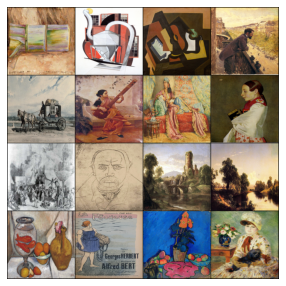

In [ ]:
sample_imgs, _ = next(data)
grid_img = torchvision.utils.make_grid(sample_imgs.clamp(-1, 1).add(1).div(2), nrow=4)
plt.figure(figsize=(10, 5))
plt.axis('off')
plt.imshow(grid_img.permute(1, 2, 0));


# Training

Now we have the dataset.

In [ ]:
wandb_run = wandb.init(project=train_cfg.wandb_project,
    entity=train_cfg.wandb_entity,
    name=train_cfg.wandb_name)

<IPython.core.display.Javascript object>

wandb: You can find your API key in your browser here: https://wandb.ai/authorize


wandb: Paste an API key from your profile and hit enter, or press ctrl+c to quit: ··········


wandb: Appending key for api.wandb.ai to your netrc file: /root/.netrc


In [ ]:
dist_util.setup_dist()

model, diffusion = create_model_and_diffusion(
    **args_to_dict(train_cfg, model_and_diffusion_defaults().keys()))
model.to(dist_util.dev())

schedule_sampler = create_named_schedule_sampler(
    train_cfg.schedule_sampler, diffusion)

In [ ]:
logger.configure(dir=train_cfg.log_dir,wandb_run=wandb_run)

try:
    TrainLoop(
    model=model,
    diffusion=diffusion,
    data=data,
    batch_size=train_cfg.batch_size,
    microbatch=train_cfg.microbatch,
    lr=train_cfg.lr,
    ema_rate=train_cfg.ema_rate,
    log_interval=train_cfg.log_interval,
    save_interval=train_cfg.save_interval,
    resume_checkpoint=train_cfg.resume_checkpoint,
    use_fp16=train_cfg.use_fp16,
    fp16_scale_growth=train_cfg.fp16_scale_growth,
    schedule_sampler=schedule_sampler,
    weight_decay=train_cfg.weight_decay,
    lr_anneal_steps=train_cfg.lr_anneal_steps,
    wandb_run=wandb_run
).run_loop()
    
except KeyboardInterrupt:
    wandb.finish()

Logging to outputs
loading model from checkpoint: /content/clip-diffusion-art/pretrained_models/lsun_uncond_100M_1200K_bs128.pt...
Logging to /tmp/openai-2022-05-05-23-33-48-893305
Found NaN, decreased lg_loss_scale to 19.0
----------------------
| loss    | 0.0354   |
| loss_q0 | 0.132    |
| loss_q1 | 0.00646  |
| loss_q2 | 0.0013   |
| loss_q3 | 0.00014  |
| mse     | 0.034    |
| mse_q0  | 0.126    |
| mse_q1  | 0.00641  |
| mse_q2  | 0.00129  |
| mse_q3  | 0.000138 |
| samples | 16       |
| step    | 0        |
| vb      | 0.00143  |
| vb_q0   | 0.00565  |
| vb_q1   | 4.71e-05 |
| vb_q2   | 1.25e-05 |
| vb_q3   | 1.64e-06 |
----------------------
saving model 0...
saving model 0.9999...
Found NaN, decreased lg_loss_scale to 18.001
----------------------
| loss    | 0.0348   |
| loss_q0 | 0.162    |
| loss_q1 | 0.0103   |
| loss_q2 | 0.00191  |
| loss_q3 | 0.000125 |
| mse     | 0.0312   |
| mse_q0  | 0.144    |
| mse_q1  | 0.0103   |
| mse_q2  | 0.0019   |
| mse_q3  | 0.000123 |


loss,▂▂█▂▁▁▂
loss_q0,▂▃█▂▂▁▂
loss_q1,▁█▂▃▅▇▇
loss_q2,▄█▄▃▂▃▁
loss_q3,█▆▂▃▇▂▁
mse,▅▄█▃▂▁▃
mse_q0,▅▆█▅▃▁▃
mse_q1,▁█▂▃▅▇▇
mse_q2,▄█▄▃▂▃▁
mse_q3,█▆▂▃▇▂▁
samples,▁▂▃▅▆▇█


In [ ]:
!wget https://api.wandb.ai/files/sreevishnu-damodaran/clip_diffusion_art/29bag3br/256x256_clip_diffusion_art.pt -q /content/clip-diffusion-art/

We used a pretrained config on the same artworks-in-public-domain dataset as our sampling config.

In [ ]:
cfg_dict = {
    "seed": 84,
    "wandb_project": "clip_diffusion_art",
    "wandb_name": "coco_2",
    "model_config": "/content/clip-diffusion-art/clip_diffusion_art/configs/256x256_clip_diffusion_art.yaml",
    "checkpoint": "/content/clip-diffusion-art/256x256_clip_diffusion_art.pt",
    "batch_size": 1,
    "skip_timesteps": 5,
    "sampling": "ddim50",
    "diffusion_steps": 1000,
    "clip_guidance_scale": 5000,
    "cutn": 60,
    "cutn_batches": 4,
    "scale_multiplier": 1,
    "tv_scale":75,
    "range_scale": 200,
    "loss_fn":"spherical",
    "clip_model": "ViT-B/16",
    "large_sr": True,
}

cfg_dict["output_dir"] = f"content/clip-diffusion-art/{cfg_dict['wandb_name']}"

cfg = SimpleNamespace(**cfg_dict)

In [ ]:
seed_all(cfg.seed)
config_file = open(cfg.model_config)
model_config = yaml.load(config_file,Loader=yaml.FullLoader)["model_config"]
print("model_config", model_config)

model_config {'attention_resolutions': '16', 'class_cond': False, 'rescale_timesteps': True, 'rescale_learned_sigmas': True, 'image_size': 256, 'learn_sigma': True, 'noise_schedule': 'linear', 'num_channels': 128, 'num_heads': 1, 'num_res_blocks': 2, 'use_checkpoint': False, 'use_fp16': 'True,', 'use_scale_shift_norm': False}


In [ ]:
clip_diffusion = ClipDiffusion(cfg.checkpoint,
    model_config=model_config,
    sampling=cfg.sampling,
    diffusion_steps=cfg.diffusion_steps,
    clip_model=cfg.clip_model,
    device=device
)

100%|███████████████████████████████████████| 335M/335M [00:09<00:00, 35.8MiB/s]


Setting up [LPIPS] perceptual loss: trunk [vgg], v[0.1], spatial [off]


Downloading: "https://download.pytorch.org/models/vgg16-397923af.pth" to /root/.cache/torch/hub/checkpoints/vgg16-397923af.pth


  0%|          | 0.00/528M [00:00<?, ?B/s]

Loading model from: /usr/local/lib/python3.7/dist-packages/lpips/weights/v0.1/vgg.pth


# Generate

In [ ]:
os.makedirs(os.path.join(cfg.output_dir, 'wandb'), exist_ok=True)

wandb_run = wandb.init(project=cfg.wandb_project,
                        dir=cfg.output_dir,
                        name=cfg.wandb_name)

wandb: Currently logged in as: coco6. Use `wandb login --relogin` to force relogin


In [ ]:
prompts =  ["vibrant matte painting of a house in an enchanted forest, artstation HQ"]
num_samples = 2
out_generator = clip_diffusion.sample(
                    prompts,
#                     args.images,
                    num_samples=num_samples,
                    batch_size=cfg.batch_size,
                    skip_timesteps=cfg.skip_timesteps,
#                     clip_denoised=cfg.clip_denoised,
#                     randomize_class=cfg.randomize_class,
#                     eta=cfg.eta,
#                     skip_augs=cfg.skip_augs,
                    cutn=cfg.cutn,
                    cutn_batches=cfg.cutn_batches,
#                     init_image=cf.init_image,
                    loss_fn=cfg.loss_fn,
                    clip_guidance_scale=cfg.clip_guidance_scale,
                    tv_scale=cfg.tv_scale,
                    range_scale=cfg.range_scale,
#                     saturation_scale=cfg.saturation_scale,
#                     init_scale=cfg.init_scale,
                    scale_multiplier=cfg.scale_multiplier,
                    output_dir=cfg.output_dir,
                    wandb_run=wandb_run
                )

0step [00:00, ?step/s]

  0%|          | 0/45 [00:00<?, ?it/s]

Sample 0 : : 44step [02:50,  3.78s/step, output=0, step=43]

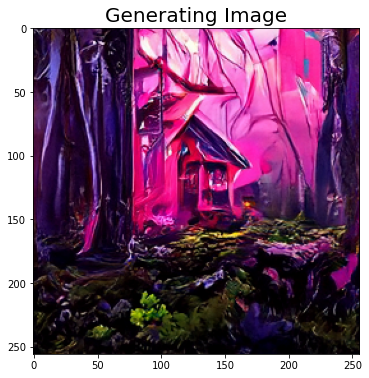

Sample 0 : : 45step [02:51,  3.81s/step, output=0, step=44]
0step [00:00, ?step/s]

  0%|          | 0/45 [00:00<?, ?it/s]

Sample 1 : : 44step [02:51,  3.77s/step, output=0, step=43]

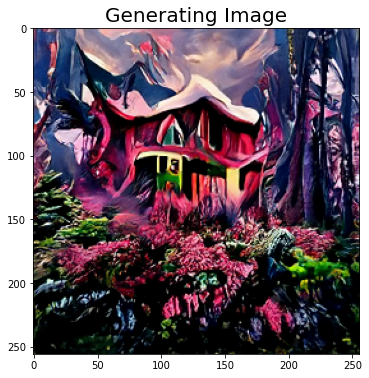

Sample 1 : : 45step [02:51,  3.82s/step, output=0, step=44]


In [ ]:
os.makedirs(cfg.output_dir, exist_ok=True)

for i, out_image in enumerate(out_generator):
    #disp_image = TF.to_pil_image(out_image.squeeze(0))
    #out_image = clip_diffusion.upscale(out_image,large_sr=cfg.large_sr)
    out_image = TF.to_pil_image(out_image.squeeze(0))
    
    fig, axs = plt.subplots(figsize=(6,6))
    axs.imshow(out_image)
    axs.set_title("Generating Image", fontsize=20)
    plt.show()
    
    current_time = datetime.now().strftime('%y%m%d-%H%M%S_%f')
    filename = f'image{i}_{current_time}.png'
    out_image.save(os.path.join(cfg.output_dir, filename))
    
    if wandb_run is not None:
        wandb.log({os.path.splitext(filename)[0]: wandb.Image(os.path.join(cfg.output_dir, filename))})

0step [00:00, ?step/s]

  0%|          | 0/45 [00:00<?, ?it/s]

Sample 0 : : 44step [02:49,  3.77s/step, output=0, step=43]

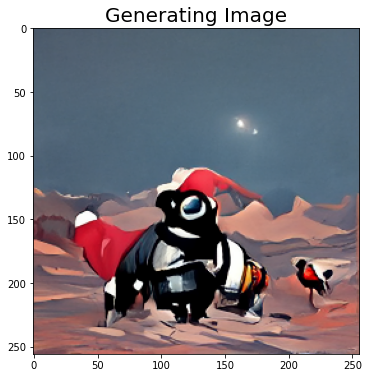

Sample 0 : : 45step [02:50,  3.79s/step, output=0, step=44]
0step [00:00, ?step/s]

  0%|          | 0/45 [00:00<?, ?it/s]

Sample 1 : : 44step [02:50,  3.79s/step, output=0, step=43]

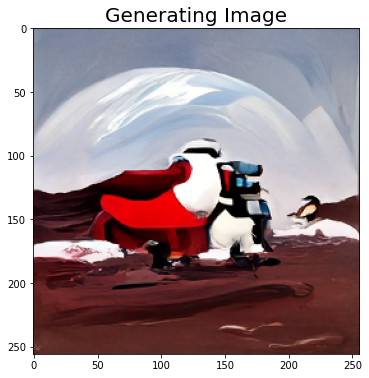

Sample 1 : : 45step [02:51,  3.80s/step, output=0, step=44]
0step [00:00, ?step/s]

  0%|          | 0/45 [00:00<?, ?it/s]

Sample 2 : : 44step [02:49,  3.78s/step, output=0, step=43]

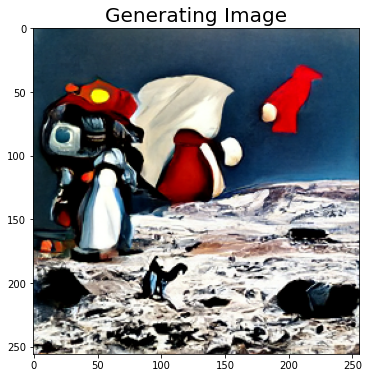

Sample 2 : : 45step [02:50,  3.79s/step, output=0, step=44]
0step [00:00, ?step/s]

  0%|          | 0/45 [00:00<?, ?it/s]

Sample 3 : : 44step [02:50,  3.79s/step, output=0, step=43]

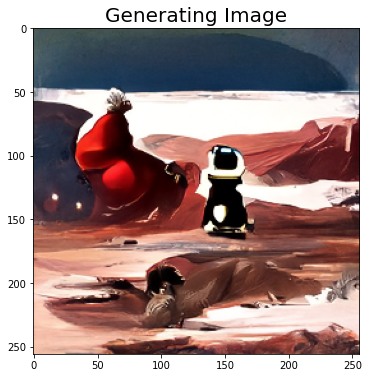

Sample 3 : : 45step [02:50,  3.80s/step, output=0, step=44]


In [ ]:
prompts =  ["a penguin on Mars wearing a spacesuit walking a robot dog next to Santa Claus, artstation HQ"]
num_samples = 4
out_generator = clip_diffusion.sample(
                    prompts,
#                     args.images,
                    num_samples=num_samples,
                    batch_size=cfg.batch_size,
                    skip_timesteps=cfg.skip_timesteps,
#                     clip_denoised=cfg.clip_denoised,
#                     randomize_class=cfg.randomize_class,
#                     eta=cfg.eta,
#                     skip_augs=cfg.skip_augs,
                    cutn=cfg.cutn,
                    cutn_batches=cfg.cutn_batches,
#                     init_image=cf.init_image,
                    loss_fn=cfg.loss_fn,
                    clip_guidance_scale=cfg.clip_guidance_scale,
                    tv_scale=cfg.tv_scale,
                    range_scale=cfg.range_scale,
#                     saturation_scale=cfg.saturation_scale,
#                     init_scale=cfg.init_scale,
                    scale_multiplier=cfg.scale_multiplier,
                    output_dir=cfg.output_dir,
                    wandb_run=wandb_run
                )
os.makedirs(cfg.output_dir, exist_ok=True)

for i, out_image in enumerate(out_generator):
    #disp_image = TF.to_pil_image(out_image.squeeze(0))
    #out_image = clip_diffusion.upscale(out_image,large_sr=cfg.large_sr)
    out_image = TF.to_pil_image(out_image.squeeze(0))
    
    fig, axs = plt.subplots(figsize=(6,6))
    axs.imshow(out_image)
    axs.set_title("Generating Image", fontsize=20)
    plt.show()
    
    current_time = datetime.now().strftime('%y%m%d-%H%M%S_%f')
    filename = f'image{i}_{current_time}.png'
    out_image.save(os.path.join(cfg.output_dir, filename))
    
    if wandb_run is not None:
        wandb.log({os.path.splitext(filename)[0]: wandb.Image(os.path.join(cfg.output_dir, filename))})

0step [00:00, ?step/s]

  0%|          | 0/45 [00:00<?, ?it/s]

Sample 0 : : 44step [02:49,  3.77s/step, output=0, step=43]

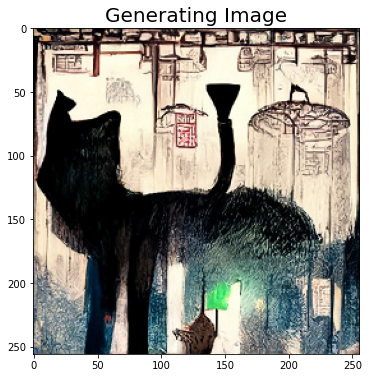

Sample 0 : : 45step [02:50,  3.78s/step, output=0, step=44]
0step [00:00, ?step/s]

  0%|          | 0/45 [00:00<?, ?it/s]

Sample 1 : : 44step [02:50,  3.78s/step, output=0, step=43]

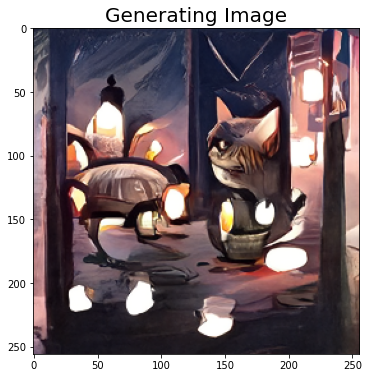

Sample 1 : : 45step [02:50,  3.80s/step, output=0, step=44]
0step [00:00, ?step/s]

  0%|          | 0/45 [00:00<?, ?it/s]

Sample 2 : : 44step [02:49,  3.77s/step, output=0, step=43]

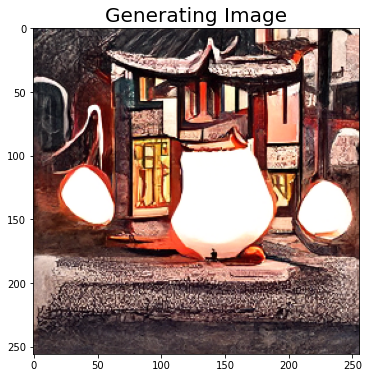

Sample 2 : : 45step [02:50,  3.79s/step, output=0, step=44]
0step [00:00, ?step/s]

  0%|          | 0/45 [00:00<?, ?it/s]

Sample 3 : : 44step [02:49,  3.78s/step, output=0, step=43]

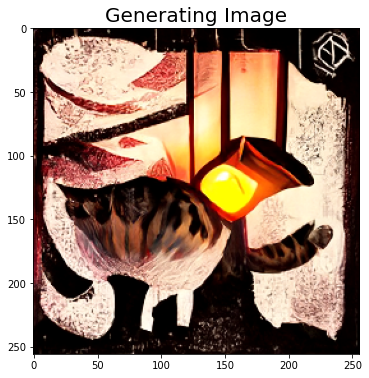

Sample 3 : : 45step [02:50,  3.79s/step, output=0, step=44]


In [ ]:
prompts =  ["a cat in the street with some lanterns, artstation HQ"]
num_samples = 4
out_generator = clip_diffusion.sample(
                    prompts,
#                     args.images,
                    num_samples=num_samples,
                    batch_size=cfg.batch_size,
                    skip_timesteps=cfg.skip_timesteps,
#                     clip_denoised=cfg.clip_denoised,
#                     randomize_class=cfg.randomize_class,
#                     eta=cfg.eta,
#                     skip_augs=cfg.skip_augs,
                    cutn=cfg.cutn,
                    cutn_batches=cfg.cutn_batches,
#                     init_image=cf.init_image,
                    loss_fn=cfg.loss_fn,
                    clip_guidance_scale=cfg.clip_guidance_scale,
                    tv_scale=cfg.tv_scale,
                    range_scale=cfg.range_scale,
#                     saturation_scale=cfg.saturation_scale,
#                     init_scale=cfg.init_scale,
                    scale_multiplier=cfg.scale_multiplier,
                    output_dir=cfg.output_dir,
                    wandb_run=wandb_run
                )

os.makedirs(cfg.output_dir, exist_ok=True)

for i, out_image in enumerate(out_generator):
    #disp_image = TF.to_pil_image(out_image.squeeze(0))
    #out_image = clip_diffusion.upscale(out_image,large_sr=cfg.large_sr)
    out_image = TF.to_pil_image(out_image.squeeze(0))
    
    fig, axs = plt.subplots(figsize=(6,6))
    axs.imshow(out_image)
    axs.set_title("Generating Image", fontsize=20)
    plt.show()
    
    current_time = datetime.now().strftime('%y%m%d-%H%M%S_%f')
    filename = f'image{i}_{current_time}.png'
    out_image.save(os.path.join(cfg.output_dir, filename))
    
    if wandb_run is not None:
        wandb.log({os.path.splitext(filename)[0]: wandb.Image(os.path.join(cfg.output_dir, filename))})

0step [00:00, ?step/s]

  0%|          | 0/45 [00:00<?, ?it/s]

Sample 0 : : 44step [02:50,  3.77s/step, output=0, step=43]

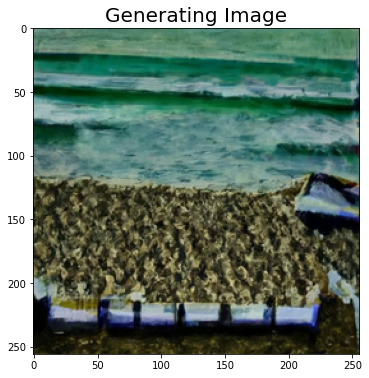

Sample 0 : : 45step [02:50,  3.79s/step, output=0, step=44]
0step [00:00, ?step/s]

  0%|          | 0/45 [00:00<?, ?it/s]

Sample 1 : : 44step [02:49,  3.77s/step, output=0, step=43]

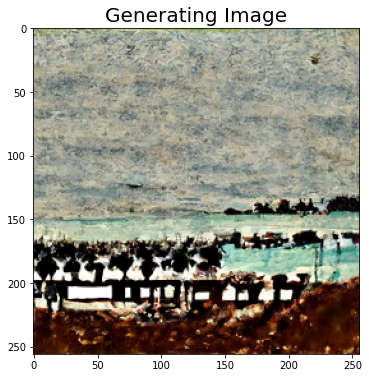

Sample 1 : : 45step [02:50,  3.79s/step, output=0, step=44]
0step [00:00, ?step/s]

  0%|          | 0/45 [00:00<?, ?it/s]

Sample 2 : : 44step [02:50,  3.78s/step, output=0, step=43]

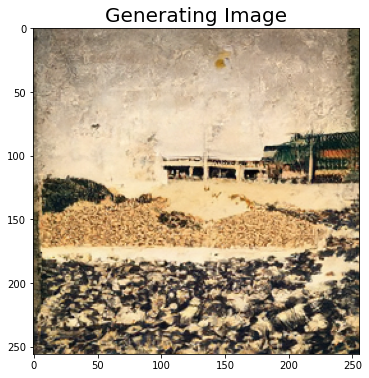

Sample 2 : : 45step [02:50,  3.79s/step, output=0, step=44]
0step [00:00, ?step/s]

  0%|          | 0/45 [00:00<?, ?it/s]

Sample 3 : : 44step [02:49,  3.77s/step, output=0, step=43]

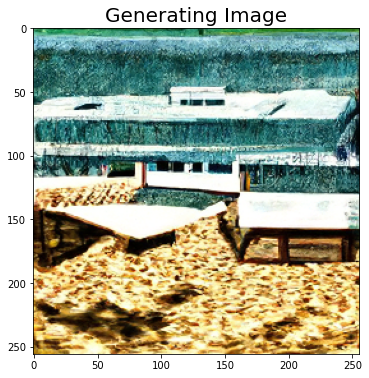

Sample 3 : : 45step [02:50,  3.79s/step, output=0, step=44]


In [ ]:
prompts =  ["a photo of beach, HQ"]
num_samples = 4
out_generator = clip_diffusion.sample(
                    prompts,
#                     args.images,
                    num_samples=num_samples,
                    batch_size=cfg.batch_size,
                    skip_timesteps=cfg.skip_timesteps,
#                     clip_denoised=cfg.clip_denoised,
#                     randomize_class=cfg.randomize_class,
#                     eta=cfg.eta,
#                     skip_augs=cfg.skip_augs,
                    cutn=cfg.cutn,
                    cutn_batches=cfg.cutn_batches,
#                     init_image=cf.init_image,
                    loss_fn=cfg.loss_fn,
                    clip_guidance_scale=cfg.clip_guidance_scale,
                    tv_scale=cfg.tv_scale,
                    range_scale=cfg.range_scale,
#                     saturation_scale=cfg.saturation_scale,
#                     init_scale=cfg.init_scale,
                    scale_multiplier=cfg.scale_multiplier,
                    output_dir=cfg.output_dir,
                    wandb_run=wandb_run
                )

os.makedirs(cfg.output_dir, exist_ok=True)

for i, out_image in enumerate(out_generator):
    #disp_image = TF.to_pil_image(out_image.squeeze(0))
    #out_image = clip_diffusion.upscale(out_image,large_sr=cfg.large_sr)
    out_image = TF.to_pil_image(out_image.squeeze(0))
    
    fig, axs = plt.subplots(figsize=(6,6))
    axs.imshow(out_image)
    axs.set_title("Generating Image", fontsize=20)
    plt.show()
    
    current_time = datetime.now().strftime('%y%m%d-%H%M%S_%f')
    filename = f'image{i}_{current_time}.png'
    out_image.save(os.path.join(cfg.output_dir, filename))
    
    if wandb_run is not None:
        wandb.log({os.path.splitext(filename)[0]: wandb.Image(os.path.join(cfg.output_dir, filename))})

0step [00:00, ?step/s]

  0%|          | 0/45 [00:00<?, ?it/s]

Sample 0 : : 44step [02:49,  3.76s/step, output=0, step=43]

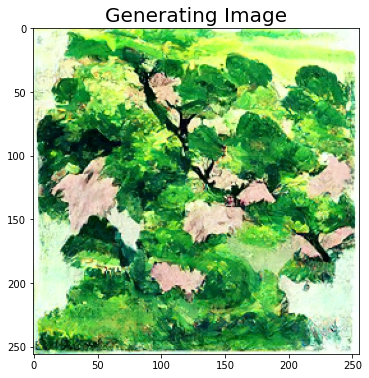

Sample 0 : : 45step [02:50,  3.78s/step, output=0, step=44]
0step [00:00, ?step/s]

  0%|          | 0/45 [00:00<?, ?it/s]

Sample 1 : : 44step [02:49,  3.78s/step, output=0, step=43]

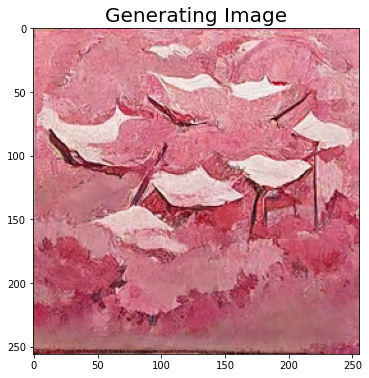

Sample 1 : : 45step [02:50,  3.78s/step, output=0, step=44]
0step [00:00, ?step/s]

  0%|          | 0/45 [00:00<?, ?it/s]

Sample 2 : : 44step [02:50,  3.78s/step, output=0, step=43]

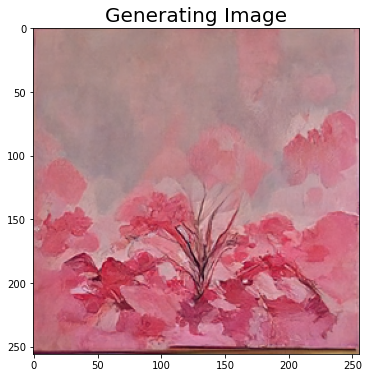

Sample 2 : : 45step [02:50,  3.80s/step, output=0, step=44]
0step [00:00, ?step/s]

  0%|          | 0/45 [00:00<?, ?it/s]

Sample 3 : : 44step [02:49,  3.77s/step, output=0, step=43]

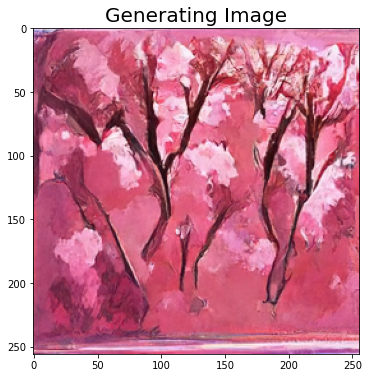

Sample 3 : : 45step [02:50,  3.78s/step, output=0, step=44]


In [ ]:
prompts =  ["a painting of sakura trees, HQ"]
num_samples = 4
out_generator = clip_diffusion.sample(
                    prompts,
#                     args.images,
                    num_samples=num_samples,
                    batch_size=cfg.batch_size,
                    skip_timesteps=cfg.skip_timesteps,
#                     clip_denoised=cfg.clip_denoised,
#                     randomize_class=cfg.randomize_class,
#                     eta=cfg.eta,
#                     skip_augs=cfg.skip_augs,
                    cutn=cfg.cutn,
                    cutn_batches=cfg.cutn_batches,
#                     init_image=cf.init_image,
                    loss_fn=cfg.loss_fn,
                    clip_guidance_scale=cfg.clip_guidance_scale,
                    tv_scale=cfg.tv_scale,
                    range_scale=cfg.range_scale,
#                     saturation_scale=cfg.saturation_scale,
#                     init_scale=cfg.init_scale,
                    scale_multiplier=cfg.scale_multiplier,
                    output_dir=cfg.output_dir,
                    wandb_run=wandb_run
                )

os.makedirs(cfg.output_dir, exist_ok=True)

for i, out_image in enumerate(out_generator):
    #disp_image = TF.to_pil_image(out_image.squeeze(0))
    #out_image = clip_diffusion.upscale(out_image,large_sr=cfg.large_sr)
    out_image = TF.to_pil_image(out_image.squeeze(0))
    
    fig, axs = plt.subplots(figsize=(6,6))
    axs.imshow(out_image)
    axs.set_title("Generating Image", fontsize=20)
    plt.show()
    
    current_time = datetime.now().strftime('%y%m%d-%H%M%S_%f')
    filename = f'image{i}_{current_time}.png'
    out_image.save(os.path.join(cfg.output_dir, filename))
    
    if wandb_run is not None:
        wandb.log({os.path.splitext(filename)[0]: wandb.Image(os.path.join(cfg.output_dir, filename))})

0step [00:00, ?step/s]

  0%|          | 0/45 [00:00<?, ?it/s]

Sample 0 : : 44step [02:49,  3.77s/step, output=0, step=43]

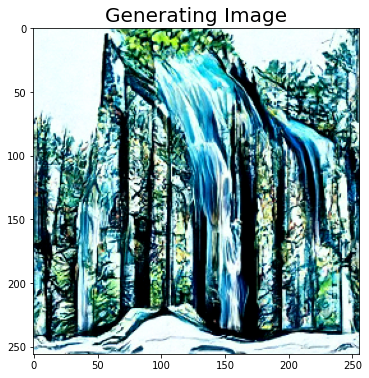

Sample 0 : : 45step [02:49,  3.77s/step, output=0, step=44]
0step [00:00, ?step/s]

  0%|          | 0/45 [00:00<?, ?it/s]

Sample 1 : : 44step [02:49,  3.77s/step, output=0, step=43]

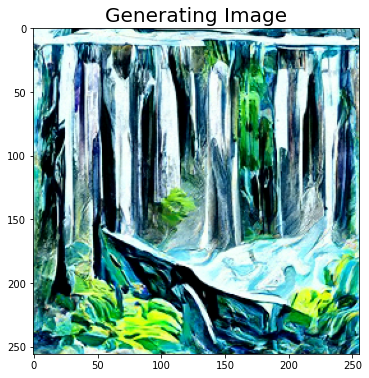

Sample 1 : : 45step [02:49,  3.78s/step, output=0, step=44]
0step [00:00, ?step/s]

  0%|          | 0/45 [00:00<?, ?it/s]

Sample 2 : : 44step [02:49,  3.76s/step, output=0, step=43]

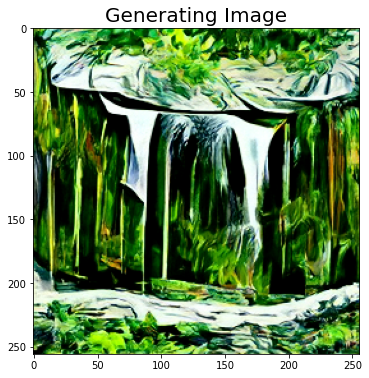

Sample 2 : : 45step [02:49,  3.78s/step, output=0, step=44]
0step [00:00, ?step/s]

  0%|          | 0/45 [00:00<?, ?it/s]

Sample 3 : : 44step [02:49,  3.77s/step, output=0, step=43]

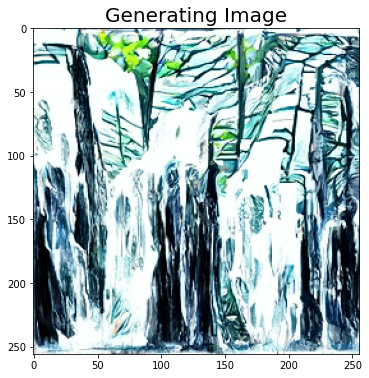

Sample 3 : : 45step [02:50,  3.78s/step, output=0, step=44]


In [ ]:
prompts =  ["digital illustration of a waterfall in the woods, HD"]
num_samples = 4
out_generator = clip_diffusion.sample(
                    prompts,
#                     args.images,
                    num_samples=num_samples,
                    batch_size=cfg.batch_size,
                    skip_timesteps=cfg.skip_timesteps,
#                     clip_denoised=cfg.clip_denoised,
#                     randomize_class=cfg.randomize_class,
#                     eta=cfg.eta,
#                     skip_augs=cfg.skip_augs,
                    cutn=cfg.cutn,
                    cutn_batches=cfg.cutn_batches,
#                     init_image=cf.init_image,
                    loss_fn=cfg.loss_fn,
                    clip_guidance_scale=cfg.clip_guidance_scale,
                    tv_scale=cfg.tv_scale,
                    range_scale=cfg.range_scale,
#                     saturation_scale=cfg.saturation_scale,
#                     init_scale=cfg.init_scale,
                    scale_multiplier=cfg.scale_multiplier,
                    output_dir=cfg.output_dir,
                    wandb_run=wandb_run
                )

os.makedirs(cfg.output_dir, exist_ok=True)

for i, out_image in enumerate(out_generator):
    #disp_image = TF.to_pil_image(out_image.squeeze(0))
    #out_image = clip_diffusion.upscale(out_image,large_sr=cfg.large_sr)
    out_image = TF.to_pil_image(out_image.squeeze(0))
    
    fig, axs = plt.subplots(figsize=(6,6))
    axs.imshow(out_image)
    axs.set_title("Generating Image", fontsize=20)
    plt.show()
    
    current_time = datetime.now().strftime('%y%m%d-%H%M%S_%f')
    filename = f'image{i}_{current_time}.png'
    out_image.save(os.path.join(cfg.output_dir, filename))
    
    if wandb_run is not None:
        wandb.log({os.path.splitext(filename)[0]: wandb.Image(os.path.join(cfg.output_dir, filename))})

0step [00:00, ?step/s]

  0%|          | 0/45 [00:00<?, ?it/s]

Sample 0 : : 44step [02:50,  3.79s/step, output=0, step=43]

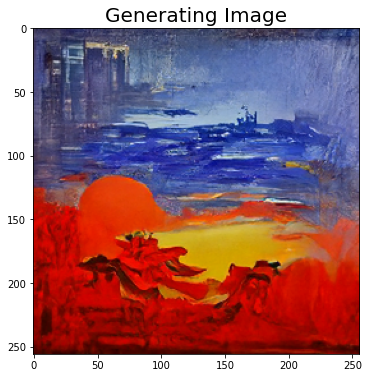

Sample 0 : : 45step [02:51,  3.82s/step, output=0, step=44]
0step [00:00, ?step/s]

  0%|          | 0/45 [00:00<?, ?it/s]

Sample 1 : : 44step [02:51,  3.79s/step, output=0, step=43]

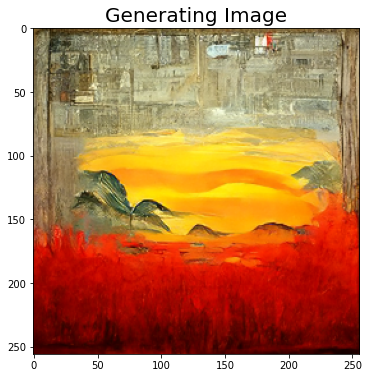

Sample 1 : : 45step [02:52,  3.83s/step, output=0, step=44]
0step [00:00, ?step/s]

  0%|          | 0/45 [00:00<?, ?it/s]

Sample 2 : : 44step [02:50,  3.78s/step, output=0, step=43]

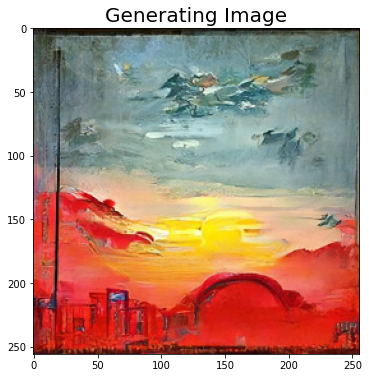

Sample 2 : : 45step [02:50,  3.79s/step, output=0, step=44]
0step [00:00, ?step/s]

  0%|          | 0/45 [00:00<?, ?it/s]

Sample 3 : : 44step [02:49,  3.77s/step, output=0, step=43]

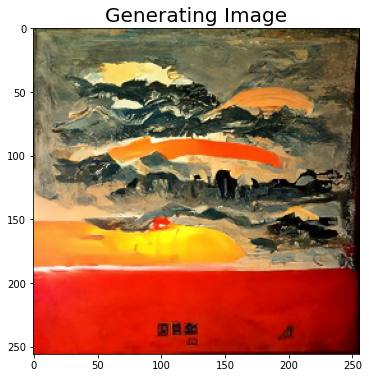

Sample 3 : : 45step [02:50,  3.79s/step, output=0, step=44]


In [ ]:
prompts =  ["a painting of sunset in shanghai, HQ"]
num_samples = 4
out_generator = clip_diffusion.sample(
                    prompts,
#                     args.images,
                    num_samples=num_samples,
                    batch_size=cfg.batch_size,
                    skip_timesteps=cfg.skip_timesteps,
#                     clip_denoised=cfg.clip_denoised,
#                     randomize_class=cfg.randomize_class,
#                     eta=cfg.eta,
#                     skip_augs=cfg.skip_augs,
                    cutn=cfg.cutn,
                    cutn_batches=cfg.cutn_batches,
#                     init_image=cf.init_image,
                    loss_fn=cfg.loss_fn,
                    clip_guidance_scale=cfg.clip_guidance_scale,
                    tv_scale=cfg.tv_scale,
                    range_scale=cfg.range_scale,
#                     saturation_scale=cfg.saturation_scale,
#                     init_scale=cfg.init_scale,
                    scale_multiplier=cfg.scale_multiplier,
                    output_dir=cfg.output_dir,
                    wandb_run=wandb_run
                )

os.makedirs(cfg.output_dir, exist_ok=True)

for i, out_image in enumerate(out_generator):
    #disp_image = TF.to_pil_image(out_image.squeeze(0))
    #out_image = clip_diffusion.upscale(out_image,large_sr=cfg.large_sr)
    out_image = TF.to_pil_image(out_image.squeeze(0))
    
    fig, axs = plt.subplots(figsize=(6,6))
    axs.imshow(out_image)
    axs.set_title("Generating Image", fontsize=20)
    plt.show()
    
    current_time = datetime.now().strftime('%y%m%d-%H%M%S_%f')
    filename = f'image{i}_{current_time}.png'
    out_image.save(os.path.join(cfg.output_dir, filename))
    
    if wandb_run is not None:
        wandb.log({os.path.splitext(filename)[0]: wandb.Image(os.path.join(cfg.output_dir, filename))})

0step [00:00, ?step/s]

  0%|          | 0/45 [00:00<?, ?it/s]

Sample 0 : : 44step [02:50,  3.95s/step, output=0, step=43]

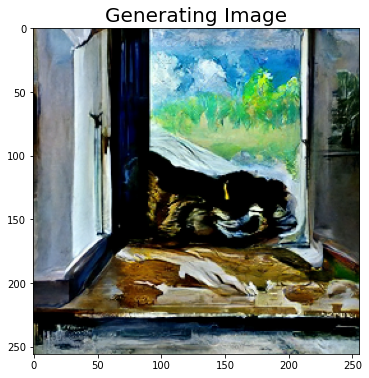

Sample 0 : : 45step [02:50,  3.80s/step, output=0, step=44]
0step [00:00, ?step/s]

  0%|          | 0/45 [00:00<?, ?it/s]

Sample 1 : : 44step [02:52,  3.77s/step, output=0, step=43]

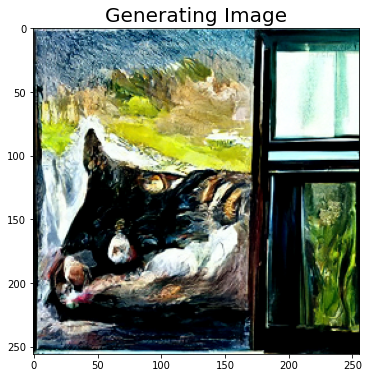

Sample 1 : : 45step [02:52,  3.84s/step, output=0, step=44]
0step [00:00, ?step/s]

  0%|          | 0/45 [00:00<?, ?it/s]

Sample 2 : : 44step [02:49,  3.77s/step, output=0, step=43]

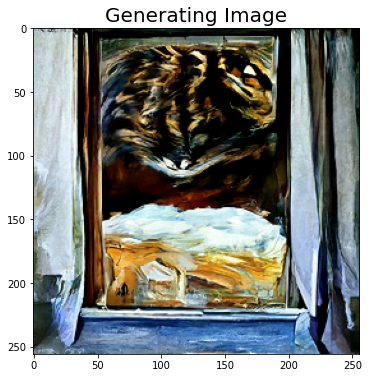

Sample 2 : : 45step [02:50,  3.78s/step, output=0, step=44]
0step [00:00, ?step/s]

  0%|          | 0/45 [00:00<?, ?it/s]

Sample 3 : : 44step [02:49,  3.77s/step, output=0, step=43]

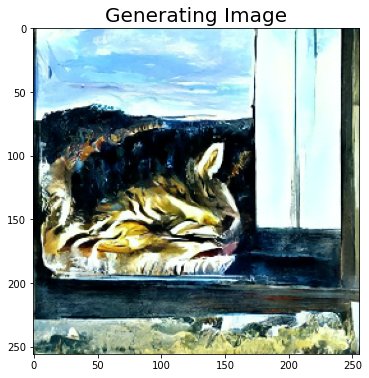

Sample 3 : : 45step [02:50,  3.78s/step, output=0, step=44]


In [ ]:
prompts =  ["oil painting of a cat beside the window, HQ"]
num_samples = 4
out_generator = clip_diffusion.sample(
                    prompts,
#                     args.images,
                    num_samples=num_samples,
                    batch_size=cfg.batch_size,
                    skip_timesteps=cfg.skip_timesteps,
#                     clip_denoised=cfg.clip_denoised,
#                     randomize_class=cfg.randomize_class,
#                     eta=cfg.eta,
#                     skip_augs=cfg.skip_augs,
                    cutn=cfg.cutn,
                    cutn_batches=cfg.cutn_batches,
#                     init_image=cf.init_image,
                    loss_fn=cfg.loss_fn,
                    clip_guidance_scale=cfg.clip_guidance_scale,
                    tv_scale=cfg.tv_scale,
                    range_scale=cfg.range_scale,
#                     saturation_scale=cfg.saturation_scale,
#                     init_scale=cfg.init_scale,
                    scale_multiplier=cfg.scale_multiplier,
                    output_dir=cfg.output_dir,
                    wandb_run=wandb_run
                )

os.makedirs(cfg.output_dir, exist_ok=True)

for i, out_image in enumerate(out_generator):
    #disp_image = TF.to_pil_image(out_image.squeeze(0))
    #out_image = clip_diffusion.upscale(out_image,large_sr=cfg.large_sr)
    out_image = TF.to_pil_image(out_image.squeeze(0))
    
    fig, axs = plt.subplots(figsize=(6,6))
    axs.imshow(out_image)
    axs.set_title("Generating Image", fontsize=20)
    plt.show()
    
    current_time = datetime.now().strftime('%y%m%d-%H%M%S_%f')
    filename = f'image{i}_{current_time}.png'
    out_image.save(os.path.join(cfg.output_dir, filename))
    
    if wandb_run is not None:
        wandb.log({os.path.splitext(filename)[0]: wandb.Image(os.path.join(cfg.output_dir, filename))})

0step [00:00, ?step/s]

  0%|          | 0/45 [00:00<?, ?it/s]

Sample 0 : : 44step [02:49,  3.77s/step, output=0, step=43]

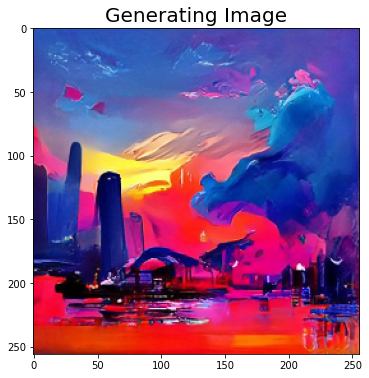

Sample 0 : : 45step [02:50,  3.79s/step, output=0, step=44]
0step [00:00, ?step/s]

  0%|          | 0/45 [00:00<?, ?it/s]

Sample 1 : : 44step [02:49,  3.78s/step, output=0, step=43]

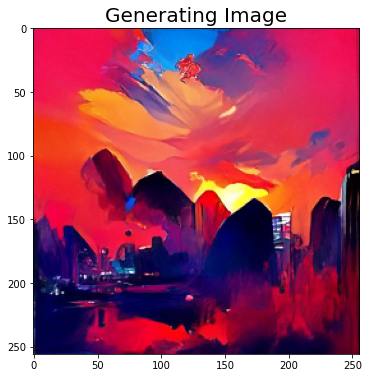

Sample 1 : : 45step [02:50,  3.79s/step, output=0, step=44]
0step [00:00, ?step/s]

  0%|          | 0/45 [00:00<?, ?it/s]

Sample 2 : : 44step [02:49,  3.77s/step, output=0, step=43]

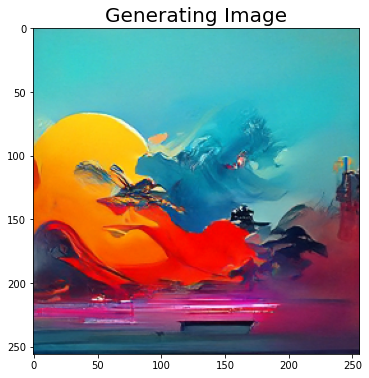

Sample 2 : : 45step [02:50,  3.78s/step, output=0, step=44]
0step [00:00, ?step/s]

  0%|          | 0/45 [00:00<?, ?it/s]

Sample 3 : : 44step [02:49,  3.78s/step, output=0, step=43]

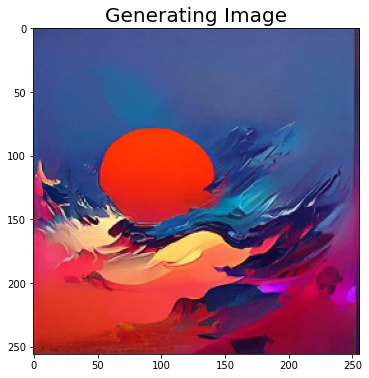

Sample 3 : : 45step [02:50,  3.79s/step, output=0, step=44]


In [ ]:
prompts =  ["vibrant painting of sunset in Shanghai, artstation HQ"]
num_samples = 4
out_generator = clip_diffusion.sample(
                    prompts,
#                     args.images,
                    num_samples=num_samples,
                    batch_size=cfg.batch_size,
                    skip_timesteps=cfg.skip_timesteps,
#                     clip_denoised=cfg.clip_denoised,
#                     randomize_class=cfg.randomize_class,
#                     eta=cfg.eta,
#                     skip_augs=cfg.skip_augs,
                    cutn=cfg.cutn,
                    cutn_batches=cfg.cutn_batches,
#                     init_image=cf.init_image,
                    loss_fn=cfg.loss_fn,
                    clip_guidance_scale=cfg.clip_guidance_scale,
                    tv_scale=cfg.tv_scale,
                    range_scale=cfg.range_scale,
#                     saturation_scale=cfg.saturation_scale,
#                     init_scale=cfg.init_scale,
                    scale_multiplier=cfg.scale_multiplier,
                    output_dir=cfg.output_dir,
                    wandb_run=wandb_run
                )

os.makedirs(cfg.output_dir, exist_ok=True)

for i, out_image in enumerate(out_generator):
    #disp_image = TF.to_pil_image(out_image.squeeze(0))
    #out_image = clip_diffusion.upscale(out_image,large_sr=cfg.large_sr)
    out_image = TF.to_pil_image(out_image.squeeze(0))
    
    fig, axs = plt.subplots(figsize=(6,6))
    axs.imshow(out_image)
    axs.set_title("Generating Image", fontsize=20)
    plt.show()
    
    current_time = datetime.now().strftime('%y%m%d-%H%M%S_%f')
    filename = f'image{i}_{current_time}.png'
    out_image.save(os.path.join(cfg.output_dir, filename))
    
    if wandb_run is not None:
        wandb.log({os.path.splitext(filename)[0]: wandb.Image(os.path.join(cfg.output_dir, filename))})